In [31]:
#import libraries 
import pandas as pd
import numpy as np
import scipy
import os
from math import ceil
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
# _______________________________________
import warnings
warnings.filterwarnings("ignore")

In [32]:
df = pd.read_csv(r'C:/Users/DF010760/Desktop/MAA_DS/Data Visualization/Project 1/Final_Dataset.csv')

In [33]:
df.head(3)

,iso_code,date,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline,country_region,new_cases_per_million,new_cases,new_deaths,new_deaths_per_million,latitude,longitude
0,ARE,2020-02-15,0.0,4.0,5.0,0.0,2.0,1.0,United Arab Emirates,0.000,0.0,0.0,0.0,23.424076,53.847818
1,ARE,2020-02-16,1.0,4.0,4.0,1.0,2.0,1.0,United Arab Emirates,0.101,1.0,0.0,0.0,23.424076,53.847818
2,ARE,2020-02-17,-1.0,1.0,5.0,1.0,2.0,1.0,United Arab Emirates,0.000,0.0,0.0,0.0,23.424076,53.847818


In [34]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47738 entries, 0 to 47737
Data columns (total 15 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   iso_code                                            47738 non-null  object 
 1   date                                                47738 non-null  object 
 2   retail_and_recreation_percent_change_from_baseline  47738 non-null  float64
 3   grocery_and_pharmacy_percent_change_from_baseline   47738 non-null  float64
 4   parks_percent_change_from_baseline                  47738 non-null  float64
 5   transit_stations_percent_change_from_baseline       47738 non-null  float64
 6   workplaces_percent_change_from_baseline             47738 non-null  float64
 7   residential_percent_change_from_baseline            47738 non-null  float64
 8   country_region                                      47738 non-null  object 


In [35]:
metric = df.iloc[:,0:12].select_dtypes(include = ['float64']).columns.to_list()

In [36]:
# Aggregate by country
df1 = df.groupby('country_region')['retail_and_recreation_percent_change_from_baseline','grocery_and_pharmacy_percent_change_from_baseline','parks_percent_change_from_baseline','transit_stations_percent_change_from_baseline','workplaces_percent_change_from_baseline','residential_percent_change_from_baseline'].mean()
df2 = df.groupby('country_region')['new_cases','new_deaths','new_cases_per_million','new_deaths_per_million'].sum()
df3 = df.groupby('country_region')['latitude','longitude'].mean()
df4 = df.groupby('country_region')['iso_code'].first()

Country_Agg = pd.concat([df1, df2, df3, df4], axis=1)

Country_Agg

,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline,new_cases,new_deaths,new_cases_per_million,new_deaths_per_million,latitude,longitude,iso_code
country_region,,,,,,,,,,,,,
Afghanistan,9.921951,25.256707,2.935976,-14.401829,-8.539634,3.768293,30820.0,1810.0,791.718,46.496,33.939110,67.709953,AFG
Angola,-18.500000,-5.402299,0.744253,-25.982184,-17.790230,10.977011,20882.0,510.0,635.360,15.493,-11.202692,17.873887,AGO
Antigua and Barbuda,-25.249857,-13.894556,15.008596,-46.794842,-34.773639,11.436103,769.0,14.0,7852.719,142.967,17.060816,-61.796428,ATG
Argentina,-50.591623,-16.408377,-64.683246,-43.044503,-23.353403,13.468586,2118676.0,52192.0,46877.740,1154.798,-38.416097,-63.616672,ARG
Australia,-16.667539,-1.125654,-13.654450,-39.109948,-17.240838,8.167539,28981.0,909.0,1136.511,35.639,-25.274398,133.775136,AUS
...,...,...,...,...,...,...,...,...,...,...,...,...,...
Venezuela,-37.067797,-14.274011,-32.285311,-38.593220,-24.838983,14.706215,139934.0,1353.0,4921.039,47.609,6.423750,-66.589730,VEN
Vietnam,-18.500000,-0.167539,-20.238220,-14.418848,-0.366492,1.518325,2459.0,35.0,25.256,0.360,14.058324,108.277199,VNM
Yemen,14.074618,25.394495,15.179817,5.737615,-1.776758,3.501529,2342.0,640.0,78.551,21.484,15.552727,48.516388,YEM


In [38]:
# Aggregate by date/country_region
df5 = df.groupby(['date', 'country_region'])['retail_and_recreation_percent_change_from_baseline','grocery_and_pharmacy_percent_change_from_baseline','parks_percent_change_from_baseline','transit_stations_percent_change_from_baseline','workplaces_percent_change_from_baseline','residential_percent_change_from_baseline'].mean()
df6 = df.groupby(['date', 'country_region'])['new_cases','new_deaths','new_cases_per_million','new_deaths_per_million'].sum()
df7 = df.groupby(['date', 'country_region'])['latitude','longitude'].mean()
df8 = df.groupby(['date', 'country_region'])['iso_code'].first()

Date_Agg = pd.concat([df5, df6, df7, df8], axis=1)

Date_Agg

retail_and_recreation_percent_change_from_baseline  \
date       country_region                                                       
2020-02-15 Argentina                                                     1.0    
           Australia                                                     4.0    
           Belgium                                                       3.0    
           Cambodia                                                      2.0    
           Canada                                                        4.0    
...                                                                      ...    
2021-03-02 Venezuela                                                   -13.0    
           Vietnam                                                     -19.0    
           Yemen                                                        32.0    
           Zambia                                                       13.0    
           Zimbabwe                                                     -2.0    

                           grocery_and_pharmacy_percent_change_from_baseline  \
date       country_region                                                      
2020-02-15 Argentina                                                    -3.0   
           Australia                                                     3.0   
           Belgium                                                       2.0   
           Cambodia                                                      0.0   
           Canada                                                        2.0   
...                                                                      ...   
2021-03-02 Venezuela                                                    17.0   
           Vietnam                                                       4.0   
           Yemen                                                        49.0   
           Zambia                                                       25.0   
           Zimbabwe                                                     26.0   

                           parks_percent_change_from_baseline  \
date       country_region                                       
2020-02-15 Argentina                                     -3.0   
           Australia                                     -2.0   
           Belgium                                       29.0   
           Cambodia                                       2.0   
           Canada                                        10.0   
...                                                       ...   
2021-03-02 Venezuela                                     -9.0   
           Vietnam                                      -28.0   
           Yemen                                         38.0   
           Zambia                                        -9.0   
           Zimbabwe                                       1.0   

                           transit_stations_percent_change_from_baseline  \
date       country_region                                                  
2020-02-15 Argentina                                                 4.0   
           Australia                                                 3.0   
           Belgium                                                   9.0   
           Cambodia                                                -17.0   
           Canada                                                    3.0   
...                                                                  ...   
2021-03-02 Venezuela                                               -33.0   
           Vietnam                                                 -17.0   
           Yemen                                                    11.0   
           Zambia                                                    0.0   
           Zimbabwe                                                -11.0   

                           workplaces_percent_change_from_baseline  \
date       country_region  

In [41]:
# Add index column
Country_Agg['Index'] = range(1, len(Country_Agg) + 1)
Country_Agg = Country_Agg.reset_index()
Country_Agg

,index,country_region,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline,new_cases,new_deaths,new_cases_per_million,new_deaths_per_million,latitude,longitude,iso_code,Index
0,0,Afghanistan,9.921951,25.256707,2.935976,-14.401829,-8.539634,3.768293,30820.0,1810.0,791.718,46.496,33.939110,67.709953,AFG,1
1,1,Angola,-18.500000,-5.402299,0.744253,-25.982184,-17.790230,10.977011,20882.0,510.0,635.360,15.493,-11.202692,17.873887,AGO,2
2,2,Antigua and Barbuda,-25.249857,-13.894556,15.008596,-46.794842,-34.773639,11.436103,769.0,14.0,7852.719,142.967,17.060816,-61.796428,ATG,3
3,3,Argentina,-50.591623,-16.408377,-64.683246,-43.044503,-23.353403,13.468586,2118676.0,52192.0,46877.740,1154.798,-38.416097,-63.616672,ARG,4
4,4,Australia,-16.667539,-1.125654,-13.654450,-39.109948,-17.240838,8.167539,28981.0,909.0,1136.511,35.639,-25.274398,133.775136,AUS,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
126,126,Venezuela,-37.067797,-14.274011,-32.285311,-38.593220,-24.838983,14.706215,139934.0,1353.0,4921.039,47.609,6.423750,-66.589730,VEN,127
127,127,Vietnam,-18.500000,-0.167539,-20.238220,-14.418848,-0.366492,1.518325,2459.0,35.0,25.256,0.360,14.058324,108.277199,VNM,128
128,128,Yemen,14.074618,25.394495,15.179817,5.737615,-1.776758,3.501529,2342.0,640.0,78.551,21.484,15.552727,48.516388,YEM,129
129,129,Zambia,-0.808571,7.400000,4.977714,-9.717143,-8.985714,8.011429,79557.0,1104.0,4327.528,60.043,-13.133897,27.849332,ZMB,130


In [42]:
# Add index column
Date_Agg['Index'] = range(1, len(Date_Agg) + 1)
Date_Agg = Date_Agg.reset_index()
Date_Agg

,date,country_region,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline,new_cases,new_deaths,new_cases_per_million,new_deaths_per_million,latitude,longitude,iso_code,Index
0,2020-02-15,Argentina,1.0,-3.0,-3.0,4.0,-1.0,0.0,0.0,0.0,0.000,0.000,-38.416097,-63.616672,ARG,1
1,2020-02-15,Australia,4.0,3.0,-2.0,3.0,3.0,0.0,0.0,0.0,0.000,0.000,-25.274398,133.775136,AUS,2
2,2020-02-15,Belgium,3.0,2.0,29.0,9.0,1.0,-1.0,0.0,0.0,0.000,0.000,50.503887,4.469936,BEL,3
3,2020-02-15,Cambodia,2.0,0.0,2.0,-17.0,5.0,0.0,0.0,0.0,0.000,0.000,12.565679,104.990963,KHM,4
4,2020-02-15,Canada,4.0,2.0,10.0,3.0,1.0,0.0,0.0,0.0,0.000,0.000,56.130366,-106.346771,CAN,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47733,2021-03-02,Venezuela,-13.0,17.0,-9.0,-33.0,-18.0,6.0,389.0,5.0,13.680,0.176,6.423750,-66.589730,VEN,47734
47734,2021-03-02,Vietnam,-19.0,4.0,-28.0,-17.0,2.0,-10.0,27.0,0.0,0.277,0.000,14.058324,108.277199,VNM,47735
47735,2021-03-02,Yemen,32.0,49.0,38.0,11.0,4.0,-3.0,32.0,6.0,1.073,0.201,15.552727,48.516388,YEM,47736
47736,2021-03-02,Zambia,13.0,25.0,-9.0,0.0,-14.0,4.0,555.0,6.0,30.189,0.326,-13.133897,27.849332,ZMB,47737


In [43]:
result.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
retail_and_recreation_percent_change_from_baseline,131.0,-24.610908,1.347314e+01,-58.022284,-33.998691,-25.249857,-16.350211,1.407462e+01
grocery_and_pharmacy_percent_change_from_baseline,131.0,-6.164167,1.239176e+01,-36.802228,-14.065079,-5.693717,-1.163668,3.040168e+01
parks_percent_change_from_baseline,131.0,-3.119795,3.012164e+01,-64.683246,-22.849212,-6.446809,15.043593,9.543194e+01
transit_stations_percent_change_from_baseline,131.0,-29.029969,1.491519e+01,-59.248864,-39.696217,-30.212202,-21.308901,9.673239e+00
workplaces_percent_change_from_baseline,131.0,-22.791426,9.612064e+00,-47.660167,-28.892524,-24.618919,-16.035920,7.554783e+00
residential_percent_change_from_baseline,131.0,9.588205,4.902585e+00,0.384824,5.987678,9.151261,12.799648,2.540947e+01
new_cases,131.0,841787.381679,2.887022e+06,45.000000,27510.500000,161530.000000,473464.000000,2.869398e+07
new_deaths,131.0,18682.816794,5.672054e+04,0.000000,333.000000,1993.000000,10584.500000,5.167370e+05
new_deaths_per_million,131.0,508.012382,5.660738e+02,0.000000,34.964000,234.200000,909.497500,1.933057e+03
latitude,131.0,21.809392,2.498015e+01,-40.900557,7.909791,23.424076,43.324885,6.192411e+01


In [44]:
result.info()

<class 'pandas.core.frame.DataFrame'>
Index: 131 entries, Afghanistan to Zimbabwe
Data columns (total 12 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   retail_and_recreation_percent_change_from_baseline  131 non-null    float64
 1   grocery_and_pharmacy_percent_change_from_baseline   131 non-null    float64
 2   parks_percent_change_from_baseline                  131 non-null    float64
 3   transit_stations_percent_change_from_baseline       131 non-null    float64
 4   workplaces_percent_change_from_baseline             131 non-null    float64
 5   residential_percent_change_from_baseline            131 non-null    float64
 6   new_cases                                           131 non-null    float64
 7   new_deaths                                          131 non-null    float64
 8   new_deaths_per_million                              131 non-null    fl

In [45]:
metric = result.iloc[:,0:12].select_dtypes(include = ['float64']).columns.to_list()

## Visual Exploration

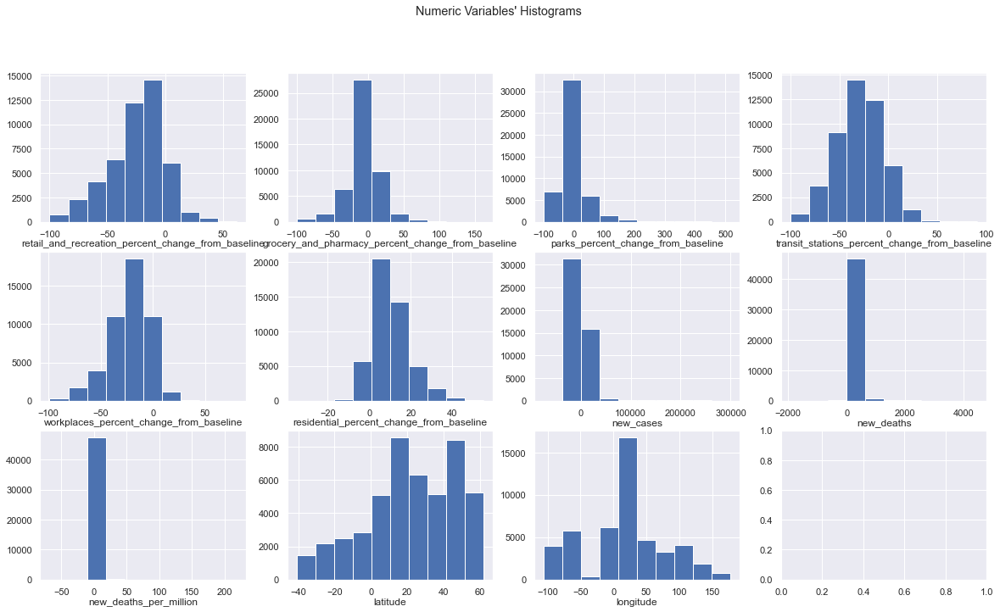

In [46]:
# All Numeric Variables' Histograms in one figure
sns.set()

# Prepare figure. Create individual axes where each histogram will be placed
fig, axes = plt.subplots(3, ceil(len(metric) / 3), figsize=(20, 11))

# Plot data
# Iterate across axes objects and associate each histogram (hint: use the ax.hist() instead of plt.hist()):
for ax, feat in zip(axes.flatten(), metric): # Notice the zip() function and flatten() method
    ax.hist(df[feat])
    ax.set_title(feat, y=-0.20)
    
# Layout
# Add a centered title to the figure:
title = "Numeric Variables' Histograms"

plt.suptitle(title)

plt.show()

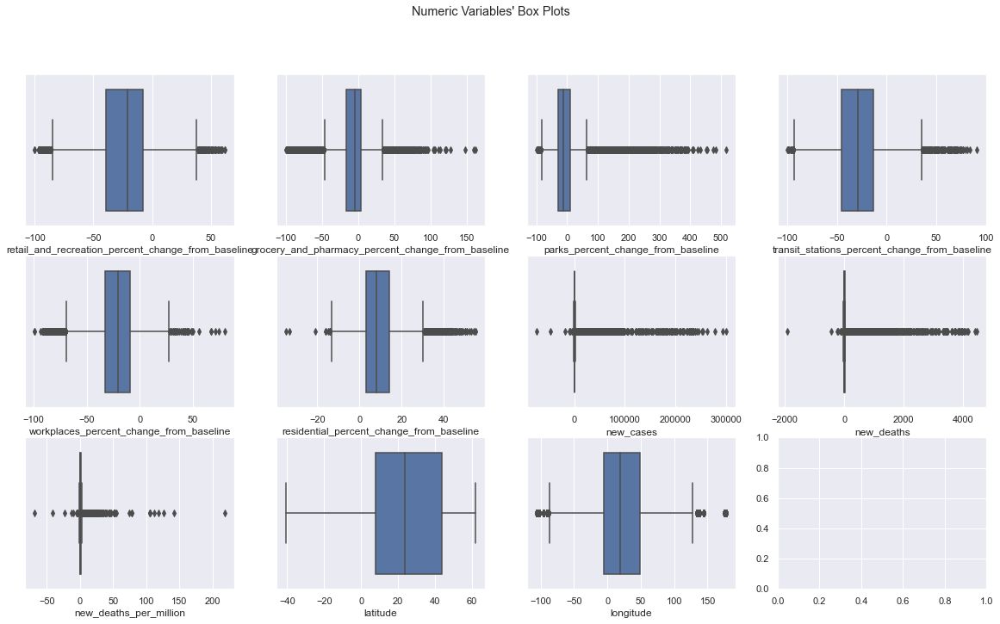

In [47]:
# All Numeric Variables' Box Plots in one figure
sns.set()

# Prepare figure. Create individual axes where each box plot will be placed
fig, axes = plt.subplots(3, ceil(len(metric) / 3), figsize=(20, 11))

# Plot data
# Iterate across axes objects and associate each box plot (hint: use the ax argument):
for ax, feat in zip(axes.flatten(), metric): # Notice the zip() function and flatten() method
    sns.boxplot(df[feat], ax=ax)
    
# Layout
# Add a centered title to the figure:
title = "Numeric Variables' Box Plots"

plt.suptitle(title)

plt.show()

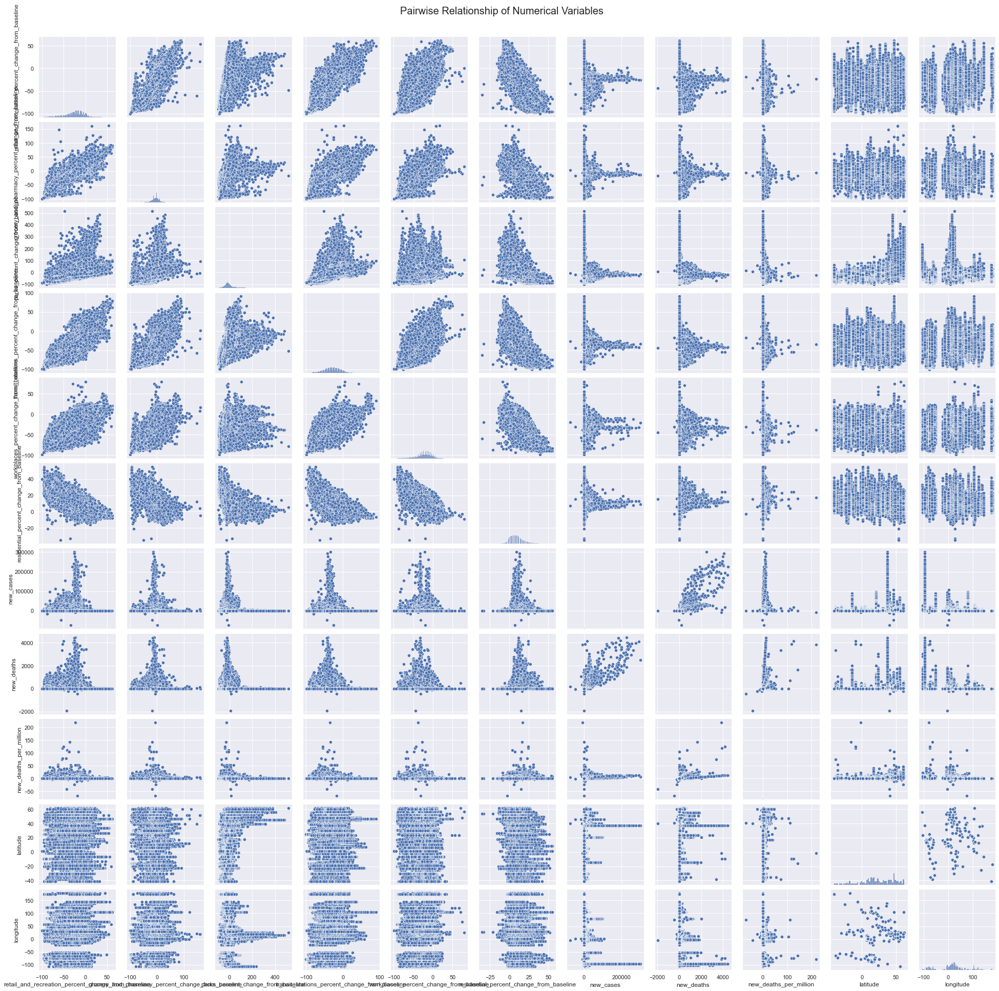

In [48]:
# Pairwise Relationship of Numerical Variables
sns.set()

# Setting pairplot
sns.pairplot(df[metric], diag_kind="hist")

# Layout
plt.subplots_adjust(top=0.95)
plt.suptitle("Pairwise Relationship of Numerical Variables", fontsize=20)

plt.show()

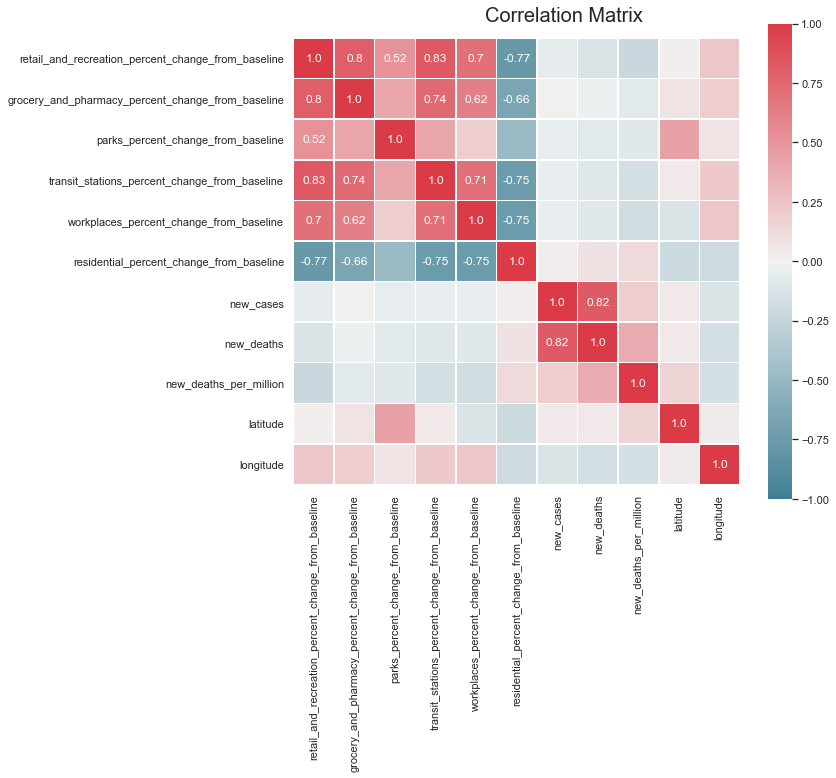

In [49]:
# Prepare figure
fig = plt.figure(figsize=(10, 8))

# Obtain correlation matrix. Round the values to 2 decimal cases. Use the DataFrame corr() and round() method.
corr = np.round(df[metric].corr(method="pearson"), decimals=2)

# Build annotation matrix (values above |0.5| will appear annotated in the plot)
mask_annot = np.absolute(corr.values) >= 0.5
annot = np.where(mask_annot, corr.values, np.full(corr.shape,"")) # Try to understand what this np.where() does

# Plot heatmap of the correlation matrix
sns.heatmap(data=corr, annot=annot, cmap=sns.diverging_palette(220, 10, as_cmap=True), 
            fmt='s', vmin=-1, vmax=1, center=0, square=True, linewidths=.5)

# Layout
fig.subplots_adjust(top=0.95)
fig.suptitle("Correlation Matrix", fontsize=20)

plt.show()

In [53]:
Date_Agg_trace1 = dict(type='scatter',
                  x=Date_Agg['date'],
                  y=Date_Agg['new_cases'],
                  name='New cases'
                  )

Date_Agg_trace2 = dict(type='scatter',
                  x=Date_Agg['date'],
                  y=Date_Agg['new_deaths'],
                  name='New deaths'
                  )

Date_Agg_data = [Date_Agg_trace1, Date_Agg_trace2]


Date_Agg_layout = dict(title=dict(text='Montly Sales over 2014 and 2015'),
                  xaxis=dict(title='date'),
                  yaxis=dict(title='New cases and deaths')
                  )

Date_Agg_fig = go.Figure(data=Date_Agg_data, layout=Date_Agg_layout)

Date_Agg_fig.show()

In [52]:
Country_Agg_y = Country_Agg['country_region']
Country_Agg_x = ['Retail & Recreation', 'Grocery & Pharmacy', 'Parks', 'Transit stations', 'Workplaces', 'Residential']
Country_Agg_z = Country_Agg[['retail_and_recreation_percent_change_from_baseline', 'grocery_and_pharmacy_percent_change_from_baseline', 'parks_percent_change_from_baseline','transit_stations_percent_change_from_baseline','workplaces_percent_change_from_baseline','residential_percent_change_from_baseline']]

Country_Agg_data = dict(type='heatmap',
                x=Country_Agg_x,
                y=Country_Agg_y,
                z=Country_Agg_z,
                name='Community Mobility - Percent change from baseline',
                colorscale='inferno',
                colorbar=dict(x=-.2, # Here these changes in terms of size and position of the colorbar dont make much sense, take a closer look in the subplot visualization below
                              len=.5,
                              y=.8)
                )

Country_Agg_layout = dict(title=dict(text='Heatmap of community mobility percent change from baseline in Various Regions'),
                  xaxis=dict(title='Community mobility'),
                  yaxis=dict(title='Country regions')
                  )

Country_Agg_fig = go.Figure(data=Country_Agg_data, layout=Country_Agg_layout)

Country_Agg_fig.show()

In [45]:
import urllib.request, json 

with urllib.request.urlopen(geo_path + 'countries.geojson') as url:
    data_geo = json.loads(url.read().decode())

NameError: name 'geo_path' is not defined